# MÉTODO DE ENTRADA DE VENTANA FECHA Y VALOR 8640 - 2880

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [2]:
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from array import *
from pickle import dump
import math

import numpy as np
import pandas as pd
import seaborn as sns

np.random.seed(123)

from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
FILEPATH = "../../datasources/THC-id-17.csv"
df_original = pd.read_csv(FILEPATH, parse_dates=True)

FILEPATH = "../../datasources/THC-id-17-preprocessed.csv"
df = pd.read_csv(FILEPATH, parse_dates=True)

In [4]:
df_original

,datetime,id,value
0,2019-01-01 03:00:00,17.0,0.087
1,2019-01-01 03:15:00,17.0,0.100
2,2019-01-01 03:30:00,17.0,0.084
3,2019-01-01 03:45:00,17.0,0.057
4,2019-01-01 04:00:00,17.0,0.167
...,...,...,...
64588,2020-11-03 22:00:00,17.0,0.031
64589,2020-11-03 22:15:00,17.0,0.055
64590,2020-11-03 22:30:00,17.0,0.019
64591,2020-11-03 22:45:00,17.0,0.021


In [5]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


In [6]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


### División de los datos

In [7]:
train_df, aux = train_test_split(df, test_size=0.4, shuffle=False)
test_df, val_df = train_test_split(aux, test_size=0.5, shuffle=False)

In [8]:
train_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
38750,-0.991445,0.130526,0.608761,-0.793353,0.616914,0.787031,0.074
38751,-0.980785,0.195090,0.601317,-0.799010,0.617055,0.786920,0.071
38752,-0.965926,0.258819,0.593820,-0.804598,0.617196,0.786809,0.071
38753,-0.946930,0.321439,0.586271,-0.810115,0.617337,0.786699,0.067


In [9]:
test_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
38755,-0.896873,0.442289,0.571021,-0.820936,0.617619,0.786477,0.058
38756,-0.866025,0.500000,0.563320,-0.826239,0.617760,0.786367,0.056
38757,-0.831470,0.555570,0.555570,-0.831470,0.617901,0.786256,0.057
38758,-0.793353,0.608761,0.547772,-0.836628,0.618042,0.786145,0.057
38759,-0.751840,0.659346,0.539926,-0.841713,0.618183,0.786035,0.056
...,...,...,...,...,...,...,...
51669,0.831470,-0.555570,-0.686997,-0.726660,0.161045,-0.986947,0.027
51670,0.793353,-0.608761,-0.693761,-0.720205,0.160868,-0.986976,0.028
51671,0.751840,-0.659346,-0.700465,-0.713687,0.160691,-0.987005,0.027
51672,0.707107,-0.707107,-0.707107,-0.707107,0.160514,-0.987034,0.028


In [10]:
val_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
51674,0.608761,-0.793353,-0.720205,-0.693761,0.160160,-0.987091,0.027
51675,0.555570,-0.831470,-0.726660,-0.686997,0.159984,-0.987120,0.028
51676,0.500000,-0.866025,-0.733052,-0.680173,0.159807,-0.987148,0.027
51677,0.442289,-0.896873,-0.739379,-0.673289,0.159630,-0.987177,0.010
51678,0.382683,-0.923880,-0.745642,-0.666347,0.159453,-0.987206,0.014
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


## Funciones auxiliares

In [11]:
def split_data(data, n_input, n_out):
    X, y = list(), list()
    in_start = 0
    
    for _ in range(len(data)):
        in_end = in_start + n_input
        out_end = in_end + n_out
        if out_end <= len(data):
            X.append(np.array(data.iloc[in_start:in_end, :]))
            y.append(np.array(data.iloc[in_end:out_end, -1]))
        in_start += 1
        
    return np.array(X).reshape(len(X), n_input, data.shape[1]), np.array(y)

In [12]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mae'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mae'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mse'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.show()

In [13]:
def plot_window_predictions(index_min, index_max, real_outputs, pred_outputs, num_plots, start):
    for n in range(start, start + num_plots):
        limit = index_min + n + n_entrada
        input_indices = np.array(df_original['datetime'].iloc[index_min + n : limit])
        input_values = np.array(df_original['value'].iloc[index_min + n : limit])
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        real_values = real_outputs[n]
        pred_values = pred_outputs[n]
        
        plt.figure()
        plt.xlabel('Time')
        plt.ylabel(f'Valores de prediccion - Iteracion {n+1}')
        plt.scatter(input_indices, input_values, color='b',zorder=2)
        plt.plot(input_indices, input_values, label='Inputs', color='b', zorder=1)
        plt.scatter(output_indices, real_values, edgecolors='k', label='Real output', c='#2ca02c', s=64)
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)
        plt.legend()

In [14]:
def plot_window_predictions_values(index_min, pred_outputs, max_plots):
    plt.figure()
    plt.xlabel('Time')
    plt.ylabel(f'Valores de prediccion')
    plt.plot(np.array(df_original['datetime'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             np.array(df_original['value'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             color='b', zorder=1)
    
    for n in range(max_plots):
        limit = index_min + n + n_entrada
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        pred_values = pred_outputs[n]
        
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)

In [15]:
import tensorflow.keras.backend as K

def smape(y_true, y_pred):
    return K.mean(2*K.abs(y_pred-y_true)/(K.abs(y_true)+K.abs(y_pred)))

## Parámetros
####  En este caso vamos a generar una ventana de 2016 valores de entrada que corresponde a las 3 semanas anteriores y una salida de 672 valores que corresponden al consumo de la siguiente semana

In [16]:
###### PARAMETERS ######
n_epochs = 200
batch_size = 128
n_entrada = 8640           # Número de mediciones en las 3 semanas anteriores
n_predicciones = 2880       # Mediciones en una semana
n_features = df.shape[1] 
########################

## Extraer datos de entrada y salida

In [17]:
data_trainX, data_trainY = split_data(train_df, n_entrada, n_predicciones)
data_valX, data_valY = split_data(val_df, n_entrada, n_predicciones)
data_testX, data_testY = split_data(test_df, n_entrada, n_predicciones)

In [18]:
data_trainX.shape

(27236, 8640, 7)

In [19]:
data_trainY.shape

(27236, 2880)

In [20]:
data_valX.shape

(1400, 8640, 7)

In [21]:
data_valY.shape

(1400, 2880)

In [22]:
data_testX.shape

(1400, 8640, 7)

In [23]:
data_testY.shape

(1400, 2880)

In [24]:
data_trainX[0]

array([[ 0.70710678,  0.70710678, -0.99371221, ...,  0.00417166,
         0.9999913 ,  0.087     ],
       [ 0.75183981,  0.65934582, -0.99471562, ...,  0.00435086,
         0.99999053,  0.1       ],
       [ 0.79335334,  0.60876143, -0.99563208, ...,  0.00453005,
         0.99998974,  0.084     ],
       ...,
       [ 0.55557023,  0.83146961, -0.50807535, ...,  0.99982117,
         0.01891118,  0.043     ],
       [ 0.60876143,  0.79335334, -0.51610627, ...,  0.99982454,
         0.01873201,  0.074     ],
       [ 0.65934582,  0.75183981, -0.52409208, ...,  0.99982788,
         0.01855285,  0.142     ]])

In [25]:
data_trainY[0]

array([0.012, 0.035, 0.004, ..., 0.296, 0.027, 0.032])

## Estandarización y normalización de los datos

In [26]:
# Normalizado
maxabs_scaler = MaxAbsScaler()
    
maxabs_scaler.fit(data_trainX.reshape(-1, data_trainX.shape[-1]))
    
scaled_trainX = maxabs_scaler.transform(data_trainX.reshape(-1, data_trainX.shape[-1])).reshape(data_trainX.shape)
scaled_valX = maxabs_scaler.transform(data_valX.reshape(-1, data_valX.shape[-1])).reshape(data_valX.shape)
scaled_testX = maxabs_scaler.transform(data_testX.reshape(-1, data_testX.shape[-1])).reshape(data_testX.shape)

In [27]:
scaled_trainX.shape

(27236, 8640, 7)

In [28]:
scaled_valX.shape

(1400, 8640, 7)

In [29]:
scaled_testX.shape

(1400, 8640, 7)

In [30]:
scaled_trainX[0]

array([[ 0.70710678,  0.70710678, -0.99371221, ...,  0.00417166,
         0.9999913 ,  0.12869822],
       [ 0.75183981,  0.65934582, -0.99471562, ...,  0.00435086,
         0.99999053,  0.14792899],
       [ 0.79335334,  0.60876143, -0.99563208, ...,  0.00453005,
         0.99998974,  0.12426036],
       ...,
       [ 0.55557023,  0.83146961, -0.50807535, ...,  0.99982117,
         0.01891118,  0.06360947],
       [ 0.60876143,  0.79335334, -0.51610627, ...,  0.99982454,
         0.01873201,  0.10946746],
       [ 0.65934582,  0.75183981, -0.52409208, ...,  0.99982788,
         0.01855285,  0.21005917]])

### Algunos modelos necesitan otros tipos de entrada

In [31]:
scaled_trainX_4D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, n_entrada, n_features)
scaled_valX_4D = scaled_valX.reshape(scaled_valX.shape[0], 1, n_entrada, n_features)
scaled_testX_4D = scaled_testX.reshape(scaled_testX.shape[0], 1, n_entrada, n_features)

scaled_trainX_5D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, 1, n_entrada, n_features)
scaled_valX_5D = scaled_valX.reshape(scaled_valX.shape[0], 1, 1, n_entrada, n_features)
scaled_testX_5D = scaled_testX.reshape(scaled_testX.shape[0], 1, 1, n_entrada, n_features)

data_trainY_3D = data_trainY.reshape(data_trainY.shape[0], 1, n_predicciones)
data_valY_3D = data_valY.reshape(data_valY.shape[0], 1, n_predicciones)
data_testY_3D = data_testY.reshape(data_testY.shape[0], 1, n_predicciones)

data_trainY_3D_2 = data_trainY.reshape(data_trainY.shape[0], n_predicciones, 1)
data_valY_3D_2 = data_valY.reshape(data_valY.shape[0], n_predicciones, 1)
data_testY_3D_2 = data_testY.reshape(data_testY.shape[0], n_predicciones, 1)

### Early stopping

In [32]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

# MODELO 2: LSTM DE DOS CAPAS

### Construimos el modelo

In [33]:
def build_model2():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [34]:
model2 = build_model2()
model2.summary()

2022-06-25 15:51:58.472100: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-25 15:51:58.901621: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30334 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:5b:00.0, compute capability: 7.0


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 8640, 128)         69632     
                                                                 
 lstm_1 (LSTM)               (None, 128)               131584    
                                                                 
 dense (Dense)               (None, 2880)              371520    
                                                                 
Total params: 572,736
Trainable params: 572,736
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [35]:
history2 = model2.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200


2022-06-25 15:52:14.608637: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100


213/213 [==============================] - 199s 917ms/step - loss: 0.0067 - mae: 0.0485 - mse: 0.0067 - smape: 0.9152 - val_loss: 0.0064 - val_mae: 0.0461 - val_mse: 0.0064 - val_smape: 0.9377
Epoch 2/200
213/213 [==============================] - 196s 921ms/step - loss: 0.0058 - mae: 0.0452 - mse: 0.0058 - smape: 0.8388 - val_loss: 0.0068 - val_mae: 0.0467 - val_mse: 0.0068 - val_smape: 0.9357
Epoch 3/200
213/213 [==============================] - 196s 918ms/step - loss: 0.0055 - mae: 0.0433 - mse: 0.0055 - smape: 0.8103 - val_loss: 0.0068 - val_mae: 0.0460 - val_mse: 0.0068 - val_smape: 0.9124
Epoch 4/200
213/213 [==============================] - 196s 918ms/step - loss: 0.0053 - mae: 0.0426 - mse: 0.0053 - smape: 0.8008 - val_loss: 0.0069 - val_mae: 0.0463 - val_mse: 0.0069 - val_smape: 0.9079
Epoch 5/200
213/213 [==============================] - 195s 915ms/step - loss: 0.0053 - mae: 0.0422 - mse: 0.0053 - smape: 0.7931 - val_loss: 0.0071 - val_mae: 0.0461 - val_mse: 0.0071 - val_s

In [36]:
hist2 = pd.DataFrame(history2.history)
hist2['epoch'] = history2.epoch
hist2

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006659,0.048454,0.006659,0.915164,0.006392,0.046086,0.006392,0.937748,0
1,0.005779,0.045183,0.005779,0.838761,0.006779,0.046680,0.006779,0.935659,1
2,0.005479,0.043271,0.005479,0.810323,0.006807,0.046008,0.006807,0.912423,2
3,0.005344,0.042578,0.005344,0.800840,0.006929,0.046332,0.006929,0.907937,3
4,0.005260,0.042169,0.005260,0.793118,0.007092,0.046097,0.007092,0.896986,4
5,0.005206,0.041897,0.005206,0.789800,0.007151,0.046473,0.007151,0.898711,5
6,0.005173,0.041726,0.005173,0.787370,0.007149,0.046106,0.007149,0.893792,6
7,0.005148,0.041594,0.005148,0.784972,0.007219,0.046319,0.007219,0.894016,7
8,0.005119,0.041435,0.005119,0.782412,0.007297,0.046621,0.007297,0.897709,8
9,0.005104,0.041361,0.005104,0.781348,0.007283,0.046361,0.007283,0.895711,9


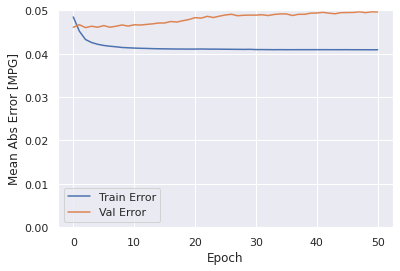

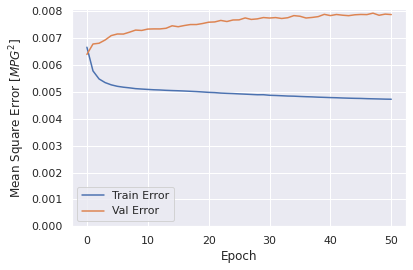

In [37]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history2)

### Evaluar predicciones

In [38]:
score_train2 = model2.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train2[0]}')
print(f'MAE:{score_train2[1]}')
print(f'MSE:{score_train2[2]}')
print(f'SMAPE:{score_train2[3]}')

852/852 [==============================] - 234s 275ms/step - loss: 0.0047 - mae: 0.0408 - mse: 0.0047 - smape: 0.8102
Loss:0.004705070983618498
MAE:0.040805116295814514
MSE:0.004705070983618498
SMAPE:0.8102413415908813


In [39]:
score_val2 = model2.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val2[0]}')
print(f'MAE:{score_val2[1]}')
print(f'MSE:{score_val2[2]}')
print(f'SMAPE:{score_val2[3]}')

44/44 [==============================] - 12s 280ms/step - loss: 0.0079 - mae: 0.0496 - mse: 0.0079 - smape: 0.9763
Loss:0.007873691618442535
MAE:0.04961773380637169
MSE:0.007873691618442535
SMAPE:0.9762907028198242


In [40]:
score_test2 = model2.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test2[0]}')
print(f'MAE:{score_test2[1]}')
print(f'MSE:{score_test2[2]}')
print(f'SMAPE:{score_test2[3]}')

44/44 [==============================] - 12s 275ms/step - loss: 0.0060 - mae: 0.0492 - mse: 0.0060 - smape: 0.9629
Loss:0.006003024987876415
MAE:0.0491783581674099
MSE:0.006003024987876415
SMAPE:0.9629411101341248


### Comparativa de resultados

In [41]:
result = hist2.iloc[-1]
comparativa2 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test2[1], score_test2[2], score_test2[3], math.sqrt(score_test2[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa2.style.set_caption("Método de ventana de varios pasos - LSTM de dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.040909,0.004725,0.812919,0.068740
VALIDACION,0.049618,0.007874,0.976306,0.088734
TEST,0.049178,0.006003,0.962941,0.077479


### Obtener predicciones

In [42]:
trainPredict2 = model2.predict(scaled_trainX)
testPredict2 = model2.predict(scaled_testX)

### Visualización de las predicciones

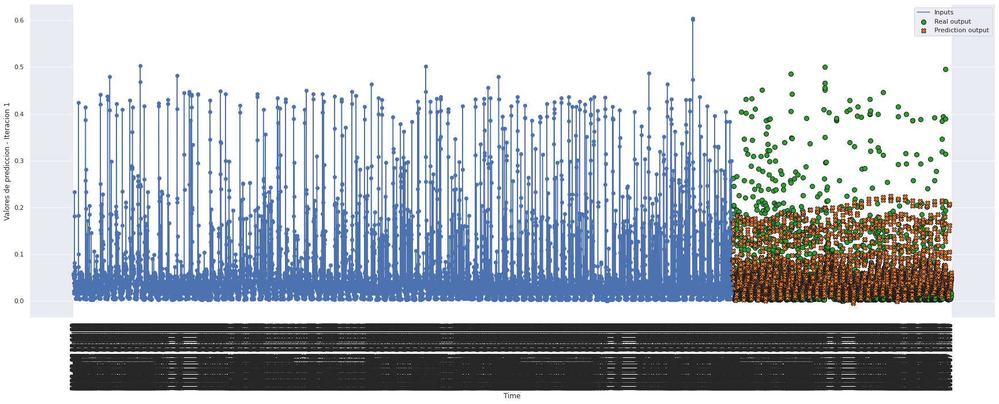

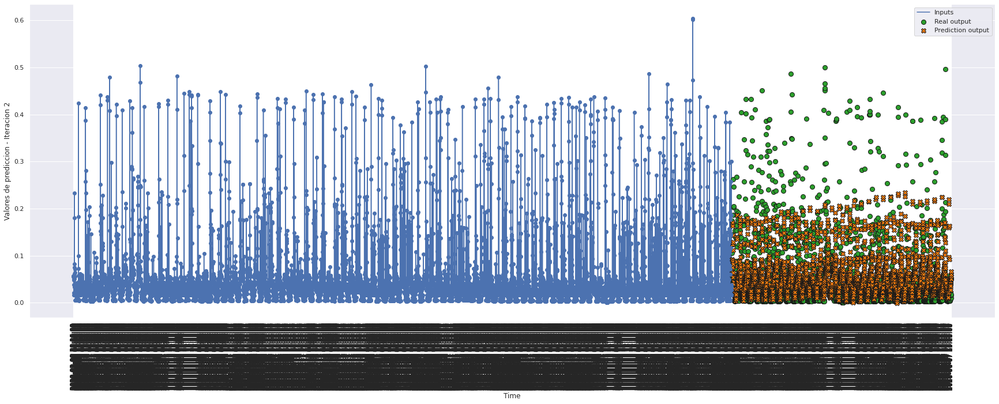

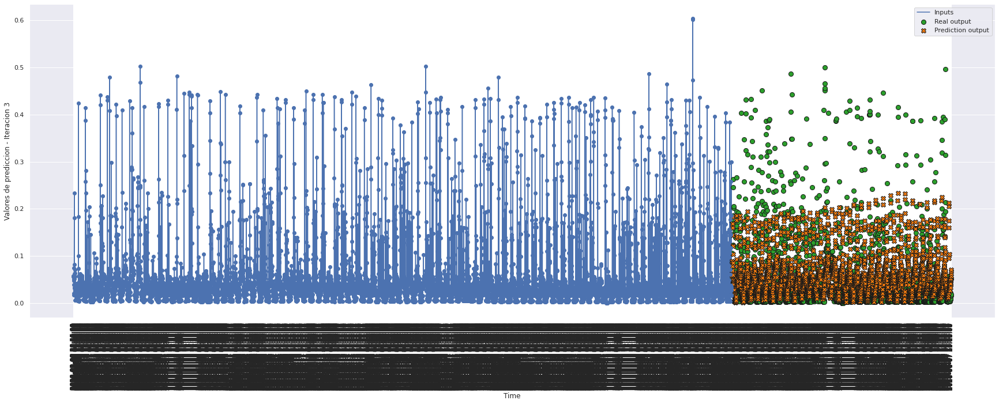

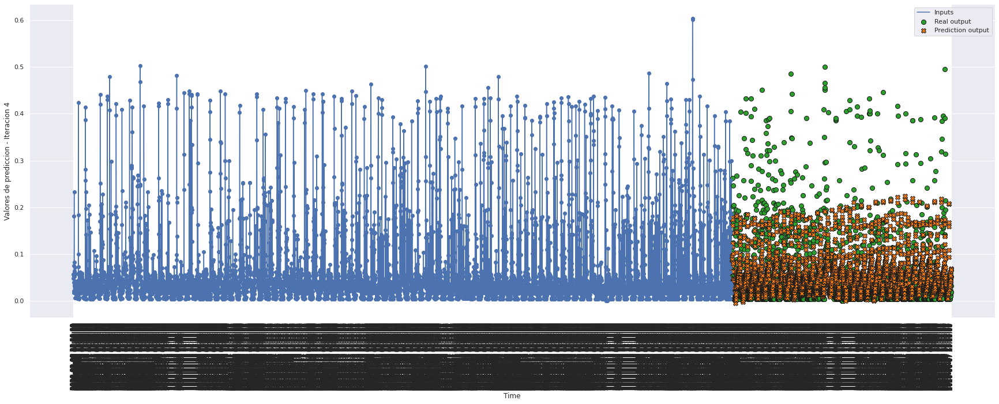

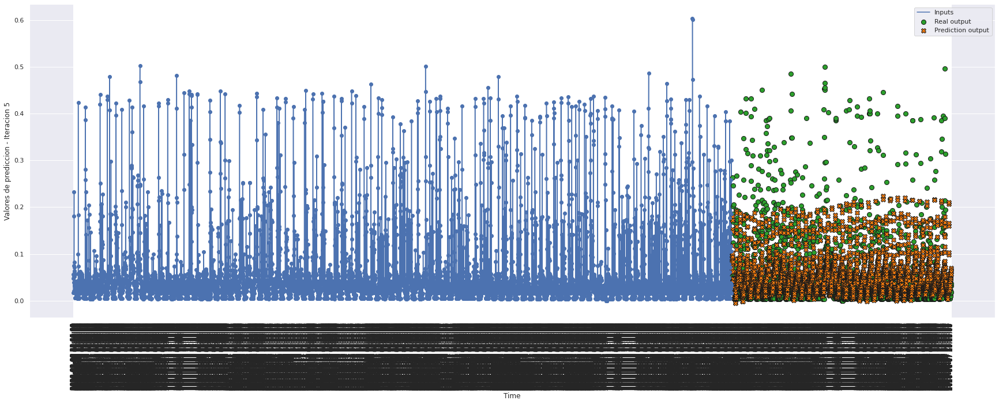

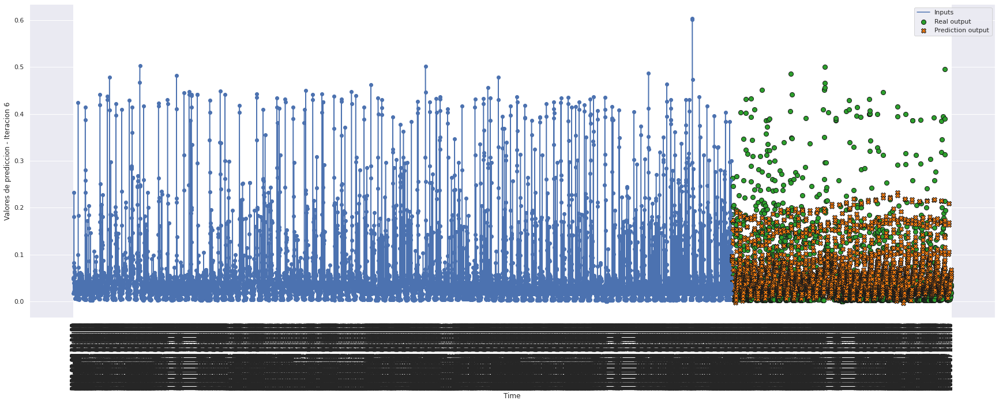

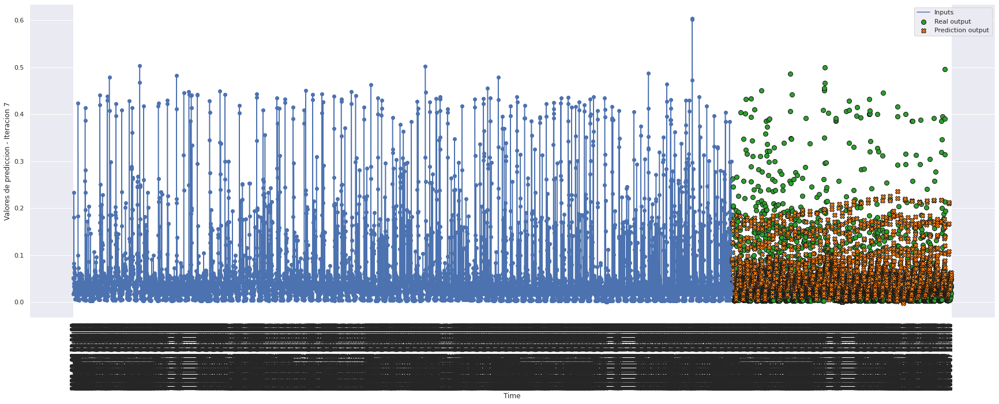

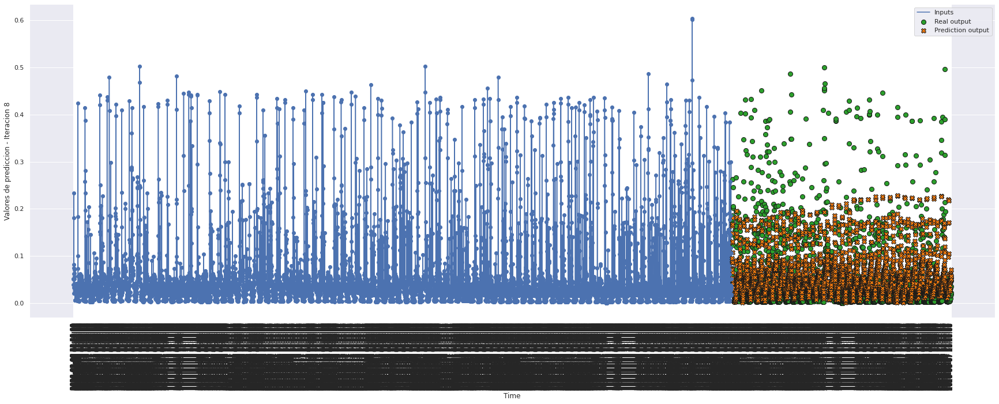

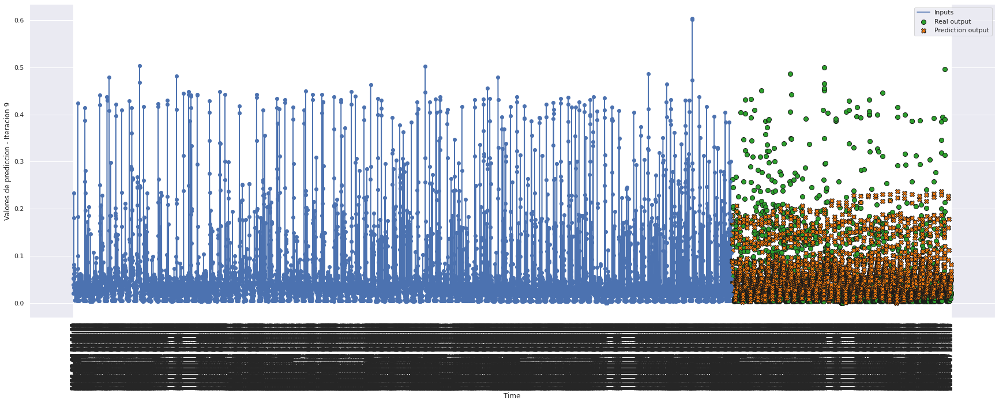

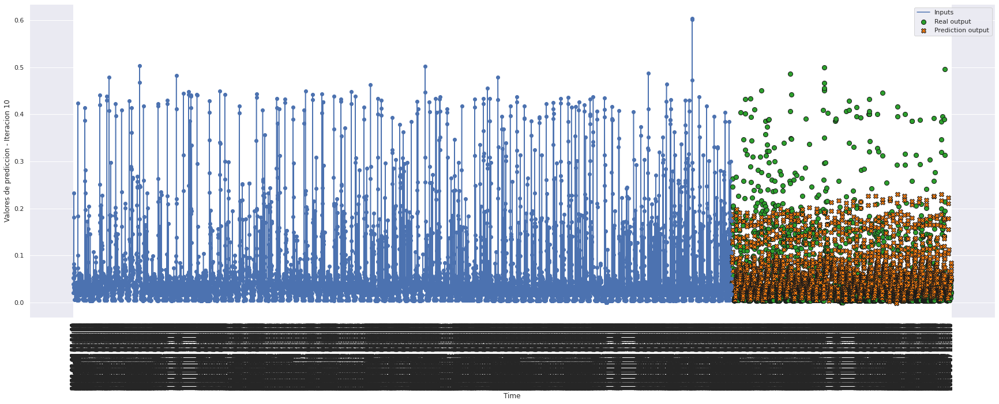

In [43]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict2, 10, 0)

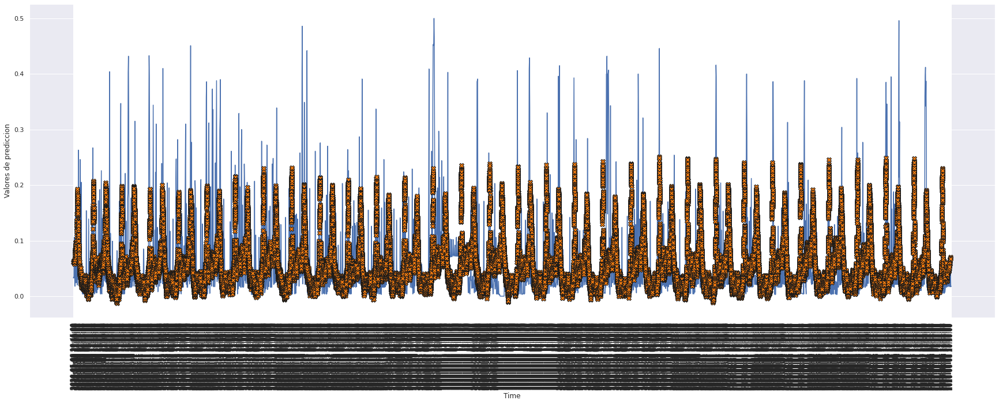

In [44]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 100)

# MODELO 10: GRU UNA CAPA

### Construimos el modelo

In [45]:
def build_model10():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [46]:
model10 = build_model10()
model10.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 128)               52608     
                                                                 
 dense_1 (Dense)             (None, 2880)              371520    
                                                                 
Total params: 424,128
Trainable params: 424,128
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [47]:
history10 = model10.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
213/213 [==============================] - 85s 393ms/step - loss: 0.0070 - mae: 0.0489 - mse: 0.0070 - smape: 0.9129 - val_loss: 0.0064 - val_mae: 0.0473 - val_mse: 0.0064 - val_smape: 0.9759
Epoch 2/200
213/213 [==============================] - 82s 385ms/step - loss: 0.0063 - mae: 0.0480 - mse: 0.0063 - smape: 0.8944 - val_loss: 0.0064 - val_mae: 0.0473 - val_mse: 0.0064 - val_smape: 0.9497
Epoch 3/200
213/213 [==============================] - 82s 386ms/step - loss: 0.0059 - mae: 0.0462 - mse: 0.0059 - smape: 0.8638 - val_loss: 0.0067 - val_mae: 0.0476 - val_mse: 0.0067 - val_smape: 0.9636
Epoch 4/200
213/213 [==============================] - 83s 392ms/step - loss: 0.0057 - mae: 0.0445 - mse: 0.0057 - smape: 0.8268 - val_loss: 0.0069 - val_mae: 0.0471 - val_mse: 0.0069 - val_smape: 0.9474
Epoch 5/200
213/213 [==============================] - 83s 388ms/step - loss: 0.0055 - mae: 0.0435 - mse: 0.0055 - smape: 0.8159 - val_loss: 0.0069 - val_mae: 0.0467 - val_mse: 0.0069 

In [48]:
hist10 = pd.DataFrame(history10.history)
hist10['epoch'] = history10.epoch
hist10

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006956,0.048867,0.006956,0.912866,0.006447,0.047300,0.006447,0.975863,0
1,0.006323,0.047996,0.006323,0.894390,0.006414,0.047268,0.006414,0.949725,1
2,0.005923,0.046206,0.005923,0.863819,0.006709,0.047617,0.006709,0.963598,2
3,0.005660,0.044483,0.005660,0.826819,0.006851,0.047104,0.006851,0.947401,3
4,0.005508,0.043492,0.005508,0.815893,0.006857,0.046738,0.006857,0.938014,4
5,0.005426,0.042988,0.005426,0.808505,0.006938,0.046946,0.006938,0.930919,5
6,0.005383,0.042720,0.005383,0.803614,0.006892,0.046698,0.006892,0.927797,6
7,0.005344,0.042505,0.005344,0.799772,0.006931,0.046534,0.006931,0.920988,7
8,0.005314,0.042345,0.005314,0.795988,0.006960,0.046542,0.006960,0.921203,8
9,0.005288,0.042204,0.005288,0.792944,0.006942,0.046322,0.006942,0.918362,9


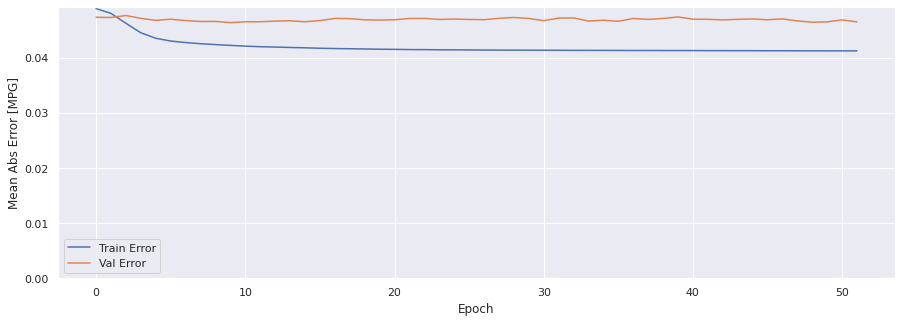

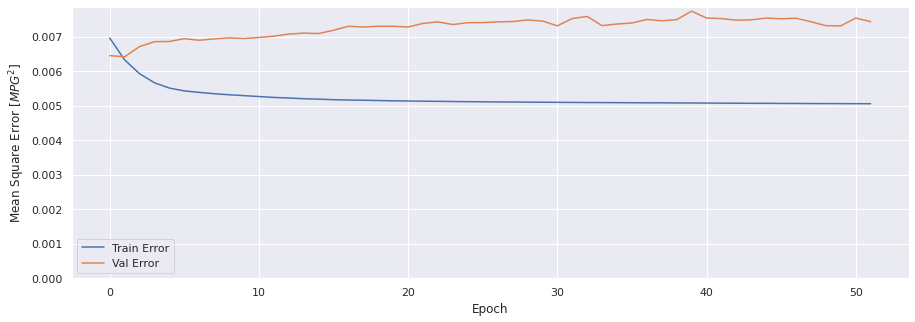

In [49]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history10)

### Evaluar predicciones

In [50]:
score_train10 = model10.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train10[0]}')
print(f'MAE:{score_train10[1]}')
print(f'MSE:{score_train10[2]}')
print(f'SMAPE:{score_train10[3]}')

852/852 [==============================] - 119s 139ms/step - loss: 0.0050 - mae: 0.0411 - mse: 0.0050 - smape: 0.7795
Loss:0.005039673298597336
MAE:0.0410538911819458
MSE:0.005039673298597336
SMAPE:0.7794662117958069


In [51]:
score_val10 = model10.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val10[0]}')
print(f'MAE:{score_val10[1]}')
print(f'MSE:{score_val10[2]}')
print(f'SMAPE:{score_val10[3]}')

44/44 [==============================] - 6s 138ms/step - loss: 0.0074 - mae: 0.0465 - mse: 0.0074 - smape: 0.8997
Loss:0.007431102450937033
MAE:0.04645724594593048
MSE:0.007431102450937033
SMAPE:0.899661660194397


In [52]:
score_test10 = model10.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test10[0]}')
print(f'MAE:{score_test10[1]}')
print(f'MSE:{score_test10[2]}')
print(f'SMAPE:{score_test10[3]}')

44/44 [==============================] - 6s 139ms/step - loss: 0.0059 - mae: 0.0483 - mse: 0.0059 - smape: 0.9523
Loss:0.005874092690646648
MAE:0.04830433055758476
MSE:0.005874092690646648
SMAPE:0.9523181319236755


### Comparativa de resultados

In [53]:
result = hist10.iloc[-1]
comparativa10 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test10[1], score_test10[2], score_test10[3], math.sqrt(score_test10[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa10.style.set_caption("Método de ventana de varios pasos - GRU una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.041205,0.005054,0.781407,0.071094
VALIDACION,0.046457,0.007431,0.899702,0.086204
TEST,0.048304,0.005874,0.952318,0.076643


### Obtener predicciones

In [54]:
trainPredict10 = model10.predict(scaled_trainX)
testPredict10 = model10.predict(scaled_testX)

### Visualización de las predicciones

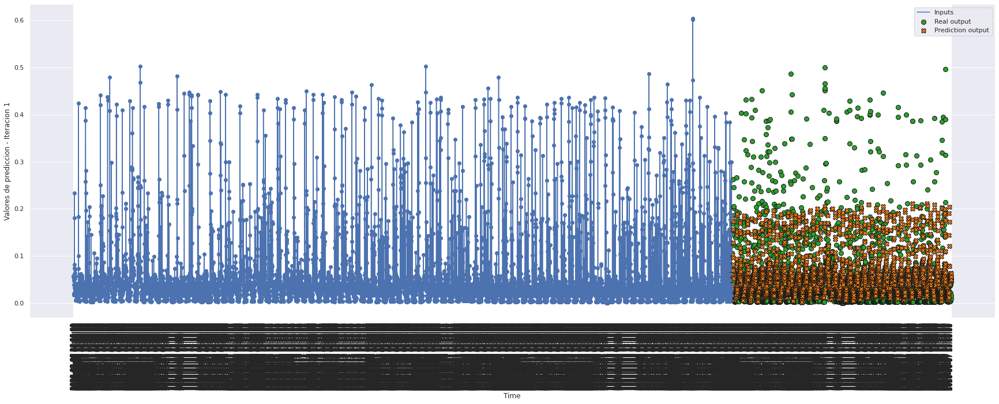

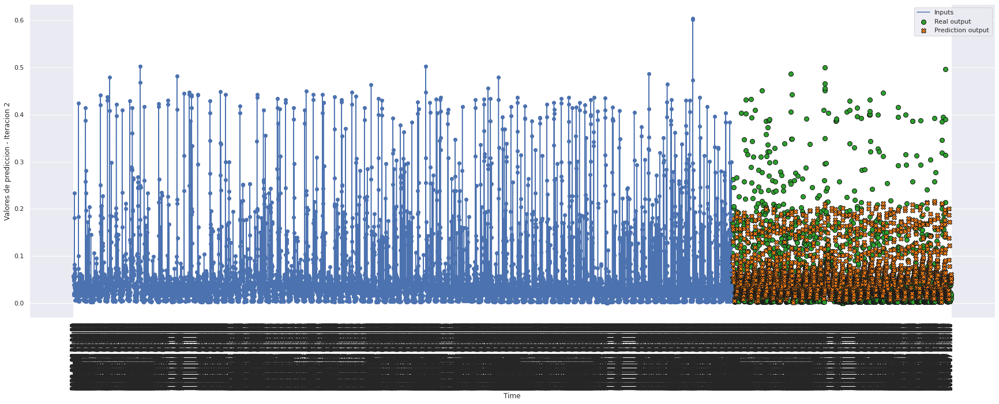

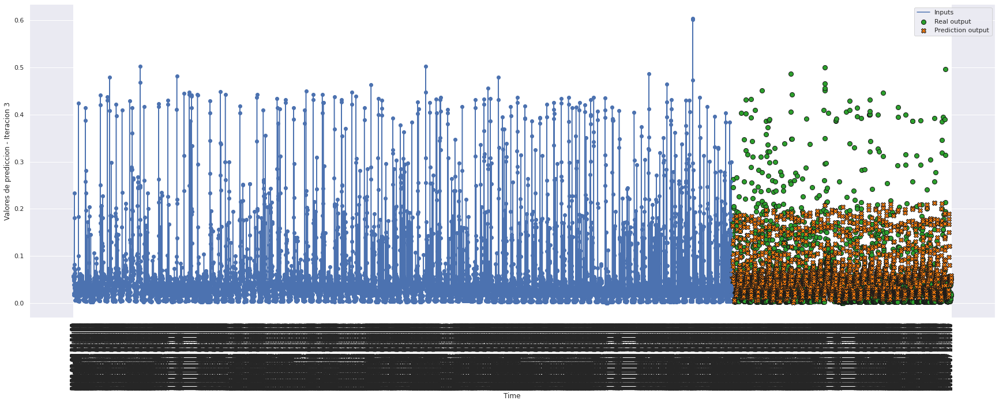

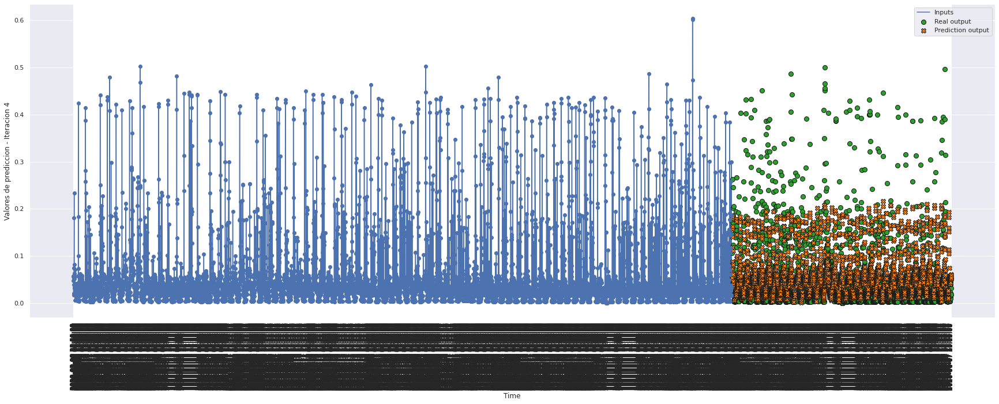

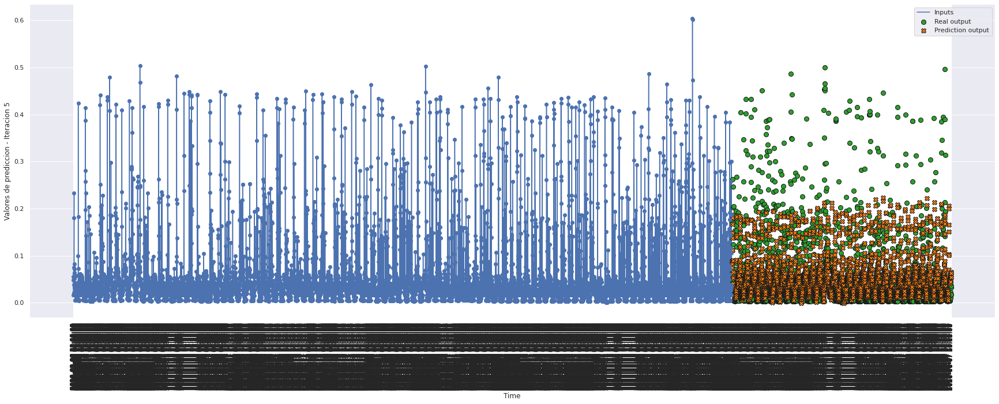

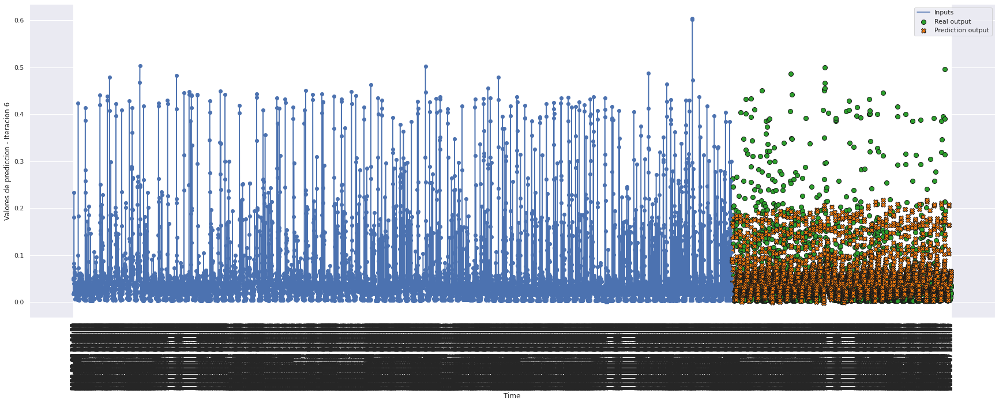

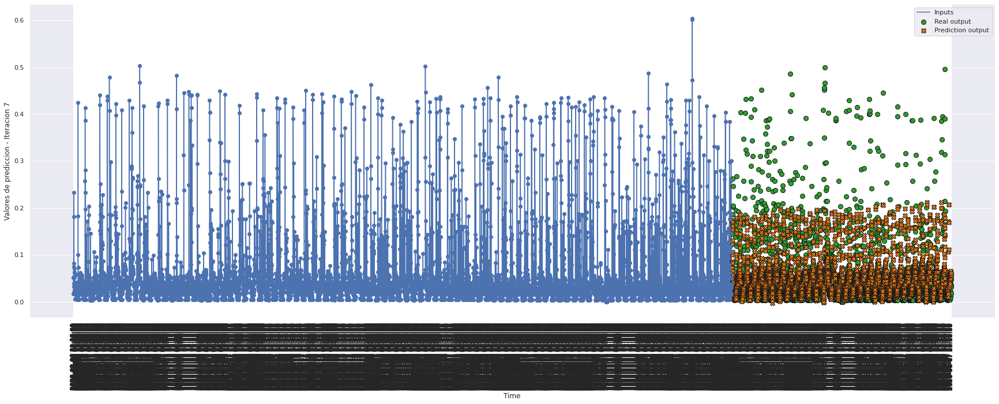

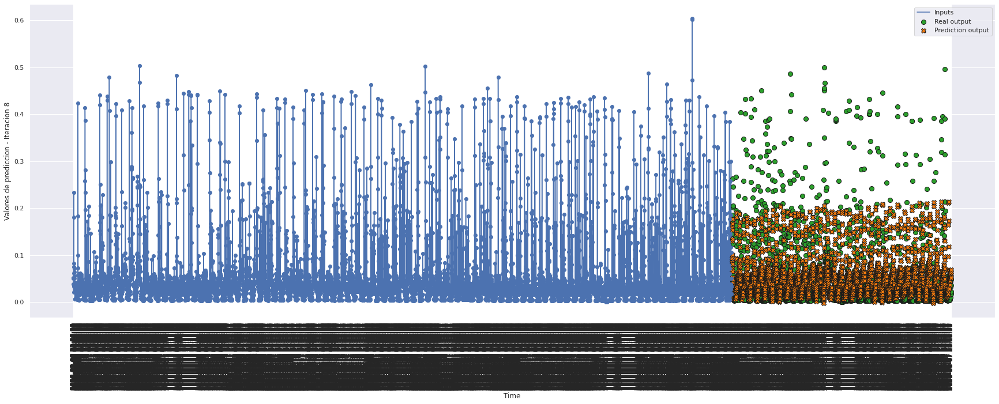

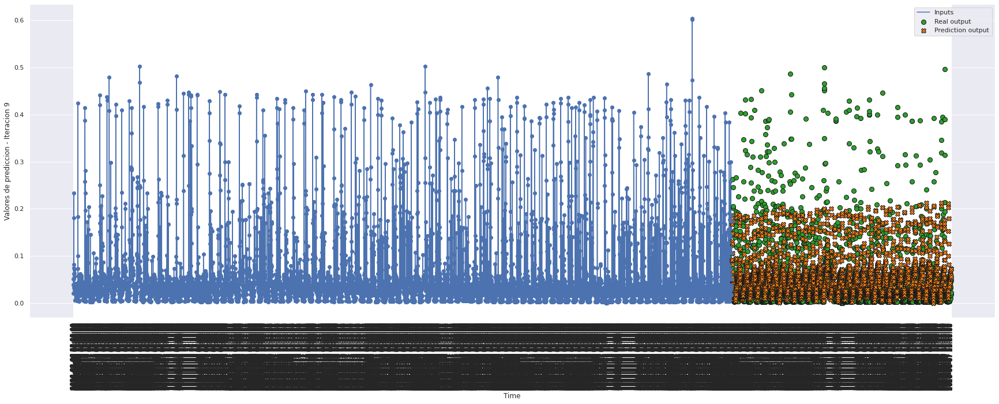

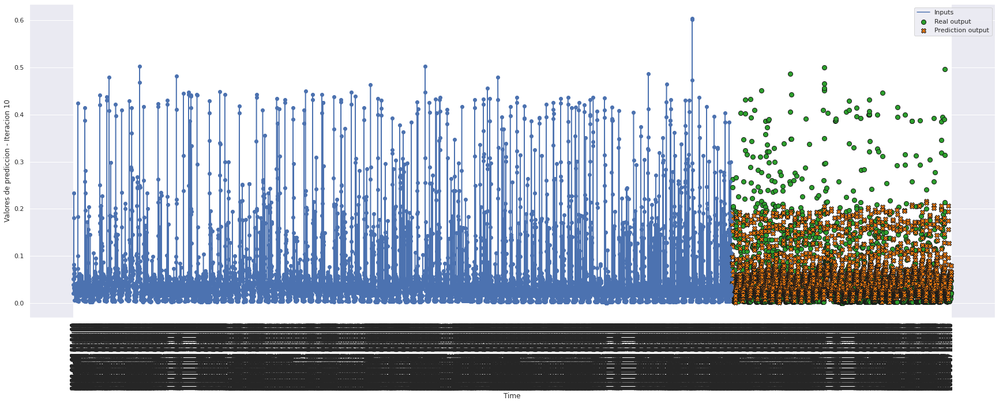

In [55]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict10, 10, 0)

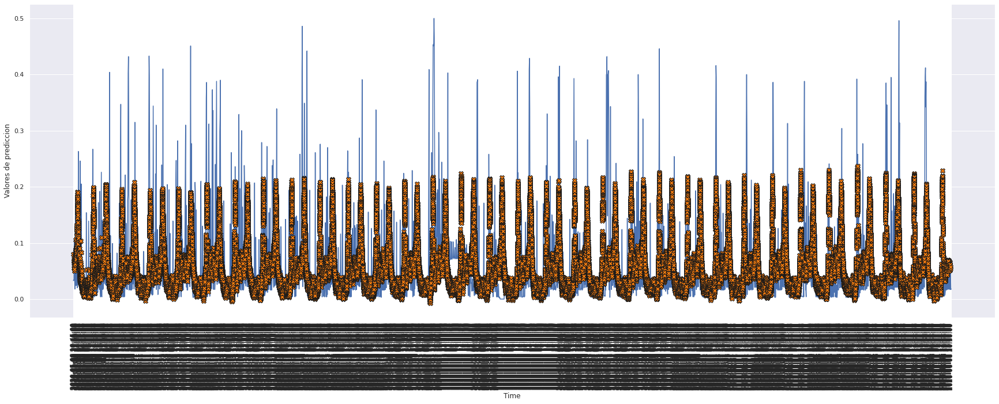

In [56]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 100)

# MODELO 11: GRU DOS CAPAS

### Construimos el modelo

In [57]:
def build_model11():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh', return_sequences=True),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [58]:
model11 = build_model11()
model11.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 8640, 128)         52608     
                                                                 
 gru_2 (GRU)                 (None, 128)               99072     
                                                                 
 dense_2 (Dense)             (None, 2880)              371520    
                                                                 
Total params: 523,200
Trainable params: 523,200
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [59]:
history11 = model11.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
213/213 [==============================] - 183s 848ms/step - loss: 0.0068 - mae: 0.0488 - mse: 0.0068 - smape: 0.9146 - val_loss: 0.0065 - val_mae: 0.0491 - val_mse: 0.0065 - val_smape: 1.0324
Epoch 2/200
213/213 [==============================] - 180s 844ms/step - loss: 0.0061 - mae: 0.0472 - mse: 0.0061 - smape: 0.8817 - val_loss: 0.0067 - val_mae: 0.0480 - val_mse: 0.0067 - val_smape: 0.9951
Epoch 3/200
213/213 [==============================] - 180s 846ms/step - loss: 0.0057 - mae: 0.0446 - mse: 0.0057 - smape: 0.8294 - val_loss: 0.0069 - val_mae: 0.0467 - val_mse: 0.0069 - val_smape: 0.9375
Epoch 4/200
213/213 [==============================] - 179s 843ms/step - loss: 0.0055 - mae: 0.0432 - mse: 0.0055 - smape: 0.8104 - val_loss: 0.0068 - val_mae: 0.0465 - val_mse: 0.0068 - val_smape: 0.9246
Epoch 5/200
213/213 [==============================] - 179s 843ms/step - loss: 0.0054 - mae: 0.0427 - mse: 0.0054 - smape: 0.8023 - val_loss: 0.0069 - val_mae: 0.0463 - val_mse: 0.

In [60]:
hist11 = pd.DataFrame(history11.history)
hist11['epoch'] = history11.epoch
hist11

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006846,0.048790,0.006846,0.914563,0.006454,0.049105,0.006454,1.032373,0
1,0.006131,0.047216,0.006131,0.881701,0.006689,0.048017,0.006689,0.995085,1
2,0.005672,0.044580,0.005672,0.829363,0.006859,0.046699,0.006859,0.937509,2
3,0.005474,0.043204,0.005474,0.810423,0.006836,0.046459,0.006836,0.924595,3
4,0.005378,0.042652,0.005378,0.802309,0.006874,0.046309,0.006874,0.920498,4
5,0.005320,0.042376,0.005320,0.796076,0.006947,0.046434,0.006947,0.911117,5
6,0.005267,0.042144,0.005267,0.791800,0.006925,0.046461,0.006925,0.909967,6
7,0.005230,0.041981,0.005230,0.790298,0.007023,0.046330,0.007023,0.904195,7
8,0.005200,0.041825,0.005200,0.788620,0.007038,0.046400,0.007038,0.904348,8
9,0.005178,0.041705,0.005178,0.786935,0.007050,0.046303,0.007050,0.903634,9


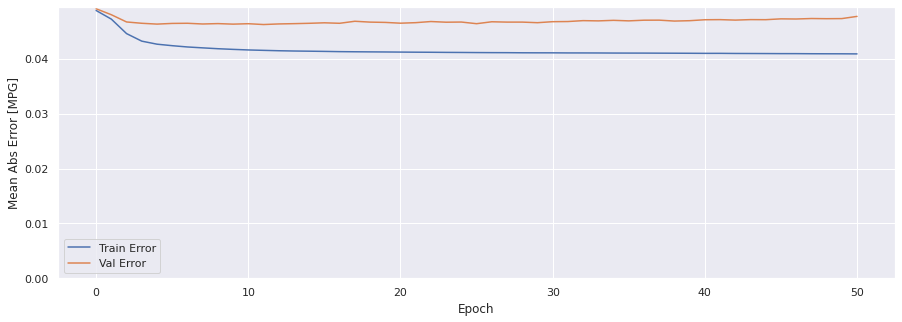

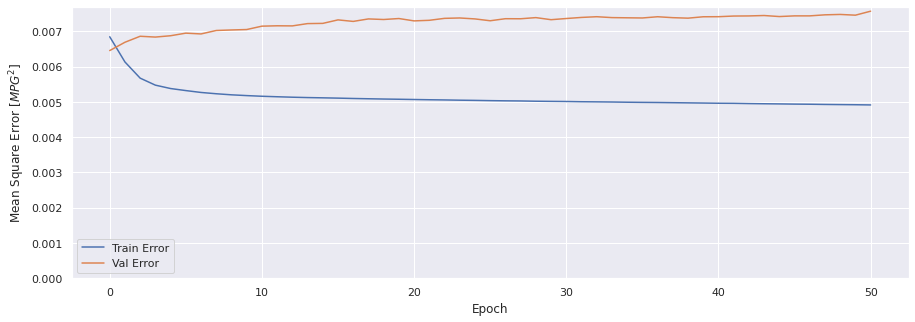

In [61]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [62]:
score_train11 = model11.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train11[0]}')
print(f'MAE:{score_train11[1]}')
print(f'MSE:{score_train11[2]}')
print(f'SMAPE:{score_train11[3]}')

852/852 [==============================] - 226s 265ms/step - loss: 0.0049 - mae: 0.0408 - mse: 0.0049 - smape: 0.7843
Loss:0.004893417935818434
MAE:0.040775373578071594
MSE:0.004893417935818434
SMAPE:0.7842974066734314


In [63]:
score_val11 = model11.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val11[0]}')
print(f'MAE:{score_val11[1]}')
print(f'MSE:{score_val11[2]}')
print(f'SMAPE:{score_val11[3]}')

44/44 [==============================] - 12s 267ms/step - loss: 0.0076 - mae: 0.0477 - mse: 0.0076 - smape: 0.9269
Loss:0.007569847162812948
MAE:0.04771319404244423
MSE:0.007569847162812948
SMAPE:0.9268587231636047


In [64]:
score_test11 = model11.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test11[0]}')
print(f'MAE:{score_test11[1]}')
print(f'MSE:{score_test11[2]}')
print(f'SMAPE:{score_test11[3]}')

44/44 [==============================] - 12s 268ms/step - loss: 0.0060 - mae: 0.0487 - mse: 0.0060 - smape: 0.9568
Loss:0.005969403777271509
MAE:0.04869857802987099
MSE:0.005969403777271509
SMAPE:0.9568043351173401


### Comparativa de resultados

In [65]:
result = hist11.iloc[-1]
comparativa11 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test11[1], score_test11[2], score_test11[3], math.sqrt(score_test11[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa11.style.set_caption("Método de ventana de varios pasos - GRU dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.040882,0.004913,0.785722,0.070093
VALIDACION,0.047713,0.007570,0.926889,0.087005
TEST,0.048699,0.005969,0.956804,0.077262


### Obtener predicciones

In [66]:
trainPredict11 = model11.predict(scaled_trainX)
testPredict11 = model11.predict(scaled_testX)

### Visualización de las predicciones

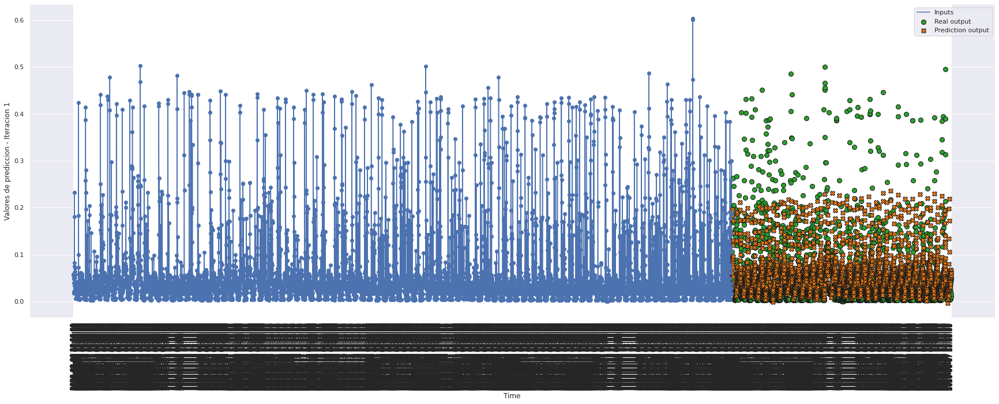

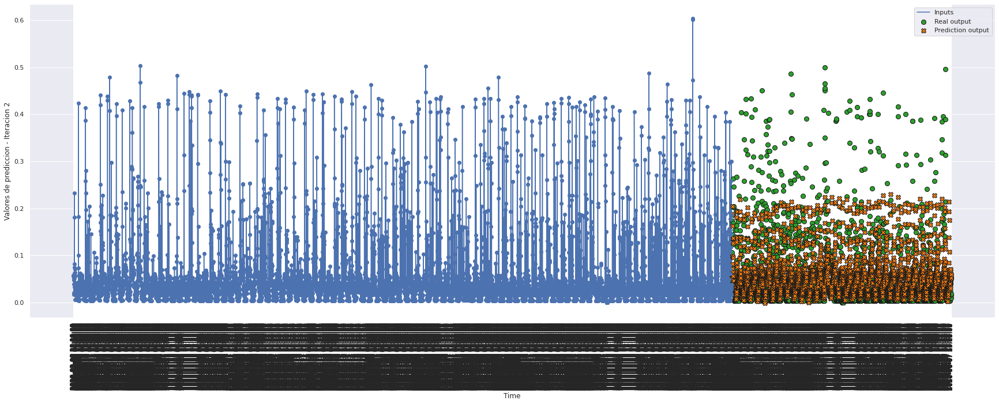

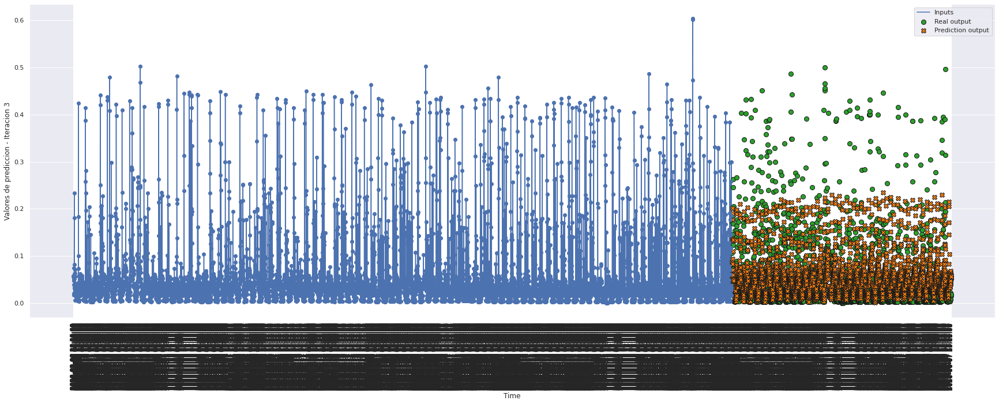

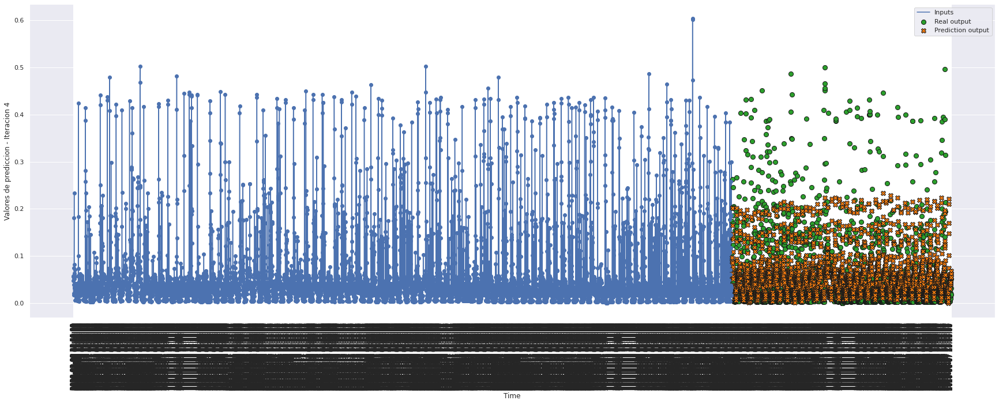

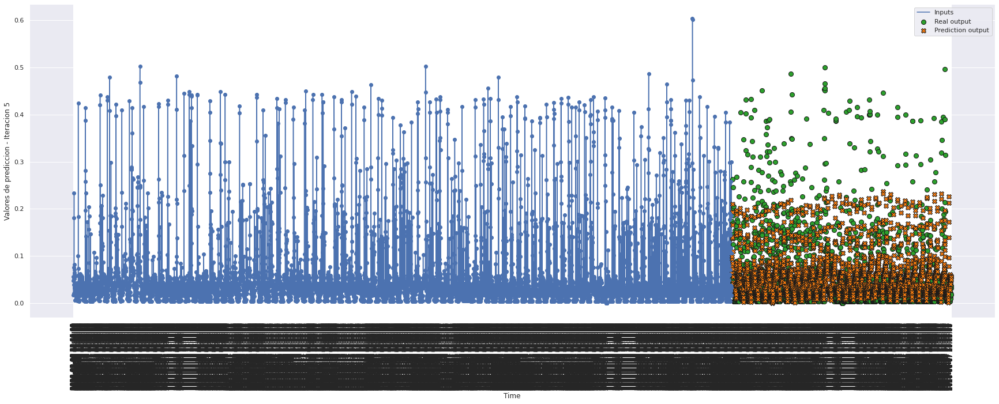

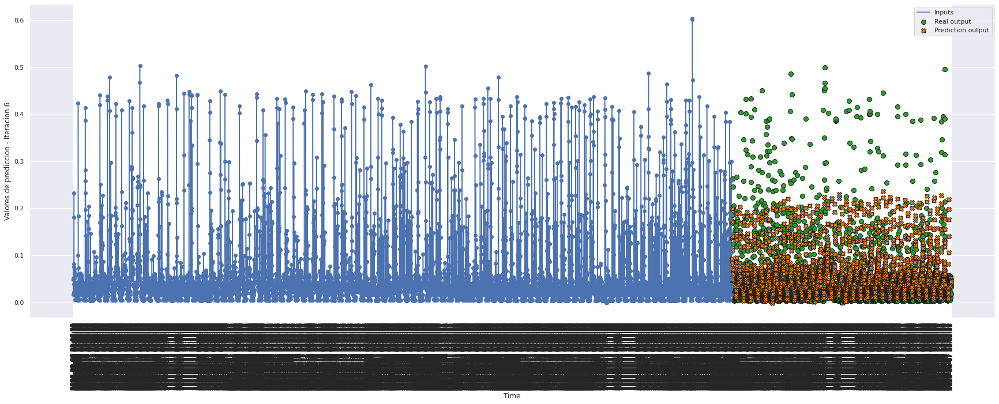

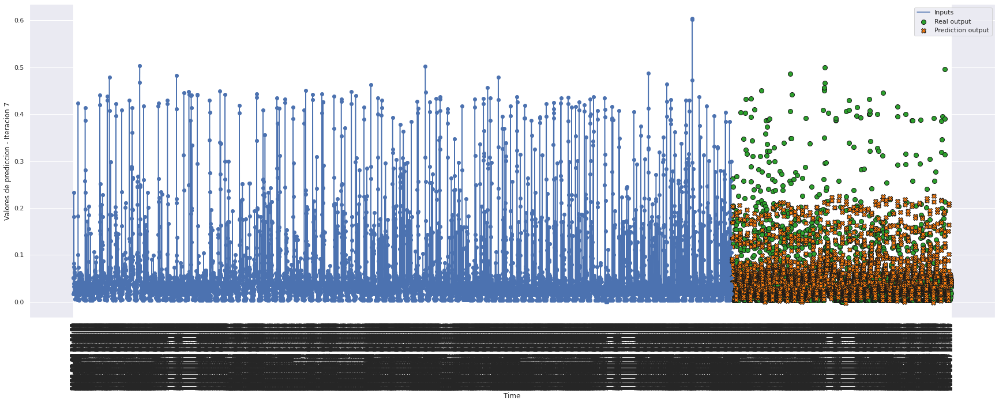

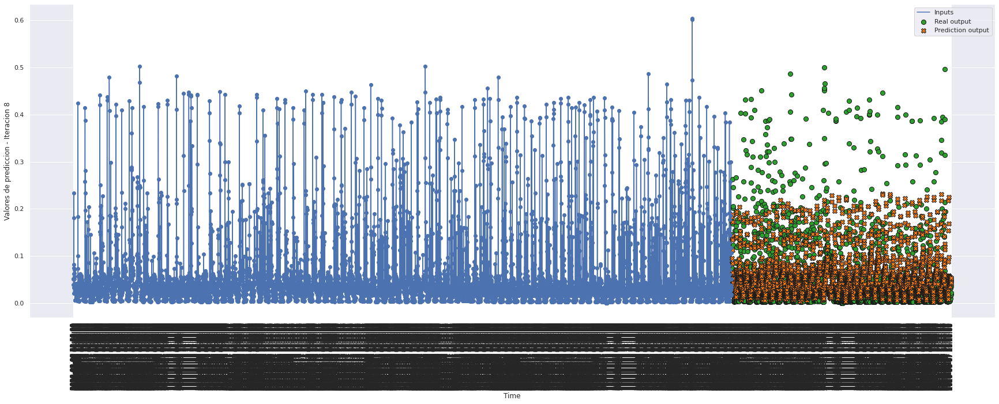

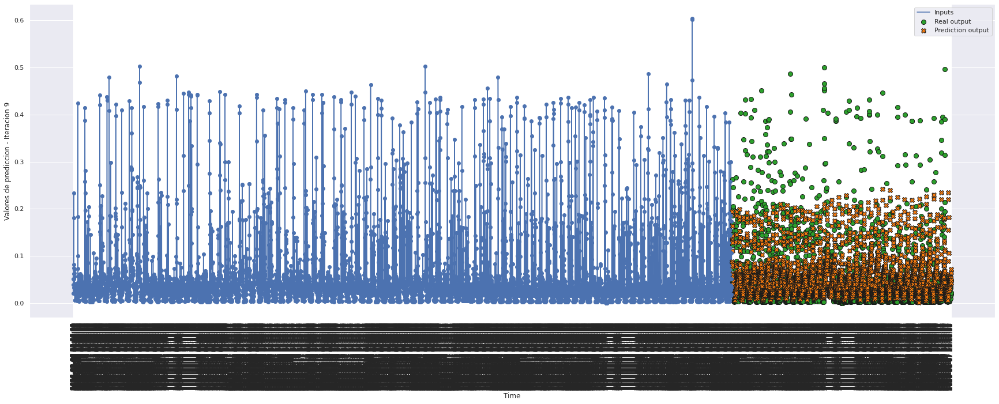

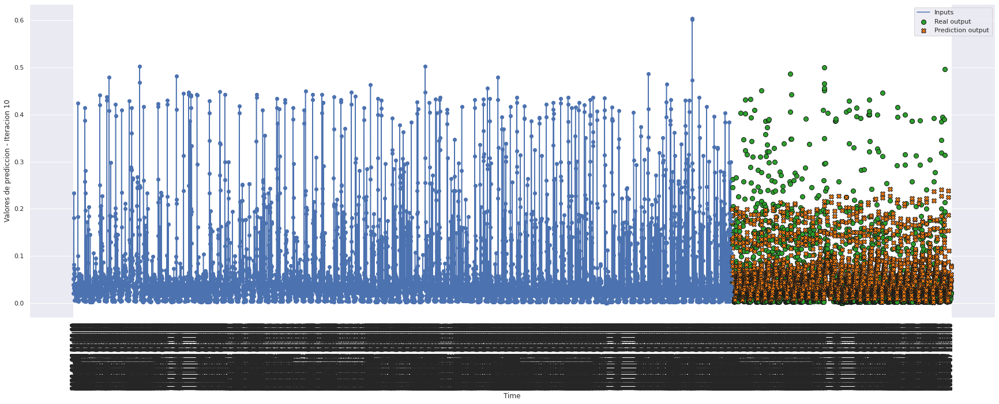

In [67]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict11, 10, 0)

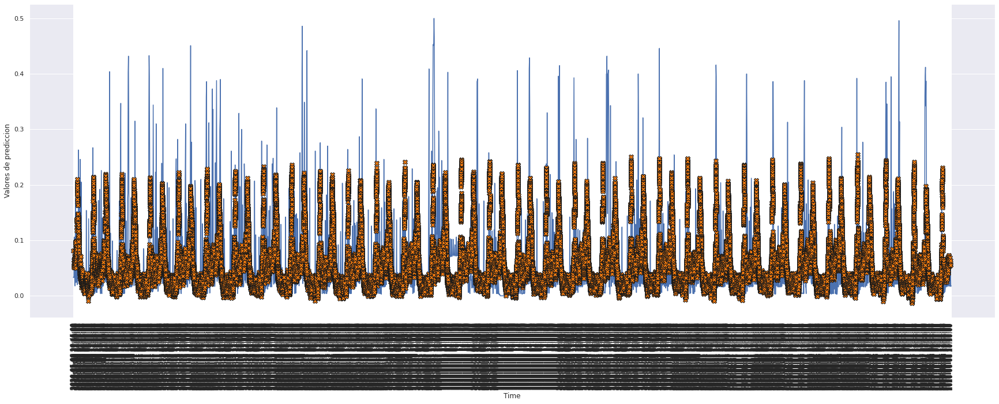

In [68]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 100)

# Comparación de modelos

In [69]:
idx = ['LSTM 2 Layer', 'GRU 1 Layer', 'GRU 2 Layer']

col = ['TR_MAE', 'TR_MSE', 'TR_SMAPE', 'TR_RMSE',
       'V_MAE', 'V_MSE', 'V_SMAPE', 'V_RMSE',
       'TS_MAE', 'TS_MSE', 'TS_SMAPE', 'TS_RMSE']

datos = [[score_train2[1], score_train2[2], score_train2[3], math.sqrt(score_train2[2]),
            score_val2[1],   score_val2[2],   score_val2[3],   math.sqrt(score_val2[2]),
           score_test2[1],  score_test2[2],  score_test2[3],  math.sqrt(score_test2[2])],
         [score_train10[1], score_train10[2], score_train10[3], math.sqrt(score_train10[2]),
            score_val10[1],   score_val10[2],   score_val10[3],   math.sqrt(score_val10[2]),
           score_test10[1],  score_test10[2],  score_test10[3],  math.sqrt(score_test10[2])],
         [score_train11[1], score_train11[2], score_train11[3], math.sqrt(score_train11[2]),
            score_val11[1],   score_val11[2],   score_val11[3],   math.sqrt(score_val11[2]),
           score_test11[1],  score_test11[2],  score_test11[3],  math.sqrt(score_test11[2])]]

comparativa = pd.DataFrame(datos, columns = col, index = idx)
comparativa.style.set_caption("Tabla de comparación de todos los modelos - Método de ventana fecha y valor 8640 - 2880")

,TR_MAE,TR_MSE,TR_SMAPE,TR_RMSE,V_MAE,V_MSE,V_SMAPE,V_RMSE,TS_MAE,TS_MSE,TS_SMAPE,TS_RMSE
LSTM 2 Layer,0.040805,0.004705,0.810241,0.068594,0.049618,0.007874,0.976291,0.088734,0.049178,0.006003,0.962941,0.077479
GRU 1 Layer,0.041054,0.005040,0.779466,0.070991,0.046457,0.007431,0.899662,0.086204,0.048304,0.005874,0.952318,0.076643
GRU 2 Layer,0.040775,0.004893,0.784297,0.069953,0.047713,0.007570,0.926859,0.087005,0.048699,0.005969,0.956804,0.077262


<AxesSubplot:title={'center':'Comparativa del error en los modelos para el mes del método de ventana de varios pasos fecha y valor'}>

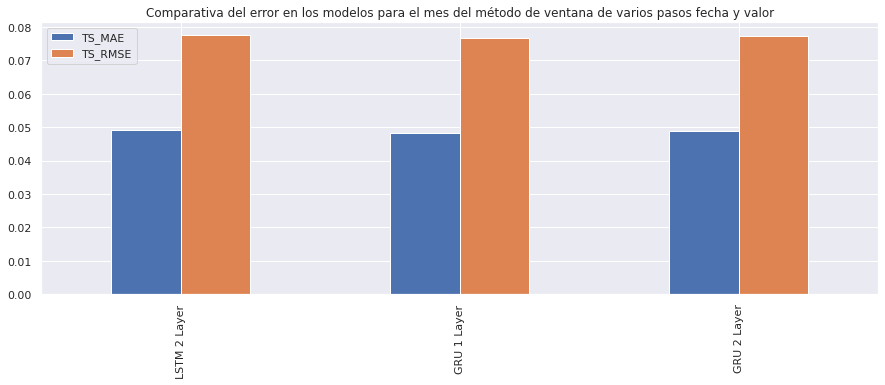

In [70]:
sns.set(rc = {'figure.figsize':(15,5)})
comparativa.loc[:, ['TS_MAE', 'TS_RMSE']].plot(kind='bar', title = 'Comparativa del error en los modelos para el mes del método de ventana de varios pasos fecha y valor')

<AxesSubplot:title={'center':'Comparativa del error porcentual absoluto medio simétrico para el mes del método de ventana de varios pasos fecha y valor'}>

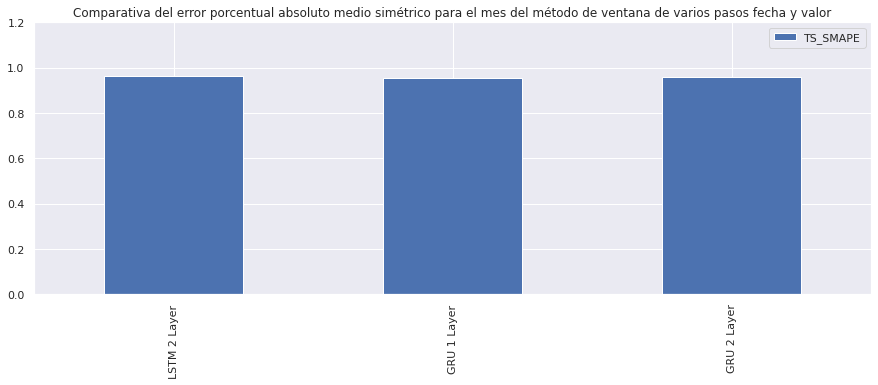

In [73]:
sns.set(rc = {'figure.figsize':(15,5)})
comparativa.loc[:, 'TS_SMAPE'].plot(kind='bar', legend=(['SMAPE']), ylim=(0, 1.2), 
                    title = 'Comparativa del error porcentual absoluto medio simétrico para el mes del método de ventana de varios pasos fecha y valor')

# Elección de modelo

In [72]:
model2.save('../../models/datetime_and_value/monthModel/1/')

2022-06-26 00:19:42.786029: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ../../models/datetime_and_value/monthModel/1/assets


INFO:tensorflow:Assets written to: ../../models/datetime_and_value/monthModel/1/assets
